In [1]:
#импорт начальных библиотек
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings

%matplotlib inline
display(HTML("<style>.container { width:80% !important; }</style>"))

warnings.filterwarnings("ignore")

In [2]:
#загрузка данных
data_file_path = './data/heart_disease_uci.csv'
df = pd.read_csv(data_file_path)

### Предварительный анализ датасета

In [3]:
df.head()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
0,1,63,Male,Cleveland,typical angina,145.0,233.0,True,lv hypertrophy,150.0,False,2.3,downsloping,0.0,fixed defect,0
1,2,67,Male,Cleveland,asymptomatic,160.0,286.0,False,lv hypertrophy,108.0,True,1.5,flat,3.0,normal,2
2,3,67,Male,Cleveland,asymptomatic,120.0,229.0,False,lv hypertrophy,129.0,True,2.6,flat,2.0,reversable defect,1
3,4,37,Male,Cleveland,non-anginal,130.0,250.0,False,normal,187.0,False,3.5,downsloping,0.0,normal,0
4,5,41,Female,Cleveland,atypical angina,130.0,204.0,False,lv hypertrophy,172.0,False,1.4,upsloping,0.0,normal,0


Column Descriptions:
<ol>
<li>id (Unique id for each patient)</li>
<li>age (Age of the patient in years)</li>
<li>origin (place of study)</li>
<li>sex (Male/Female)</li>
<li>cp chest pain type ([typical angina, atypical angina, non-anginal, asymptomatic])</li>
<li>trestbps resting blood pressure (resting blood pressure (in mm Hg on admission to the hospital))</li>
<li>chol (serum cholesterol in mg/dl)</li>
<li>fbs (if fasting blood sugar > 120 mg/dl)</li>
<li>restecg (resting electrocardiographic results) -- Values: [normal, stt abnormality, lv hypertrophy]</li>
<li>thalach: maximum heart rate achieved</li>
<li>exang: exercise-induced angina (True/ False)</li>
<li>oldpeak: ST depression induced by exercise relative to rest</li>
<li>slope: the slope of the peak exercise ST segment</li>
<li>ca: number of major vessels (0-3) colored by fluoroscopy</li>
<li>thal: [normal; fixed defect; reversible defect]</li>
<li>num: the predicted attribute</li>
</ol>

In [4]:
target = 'num'

<AxesSubplot:xlabel='num', ylabel='count'>

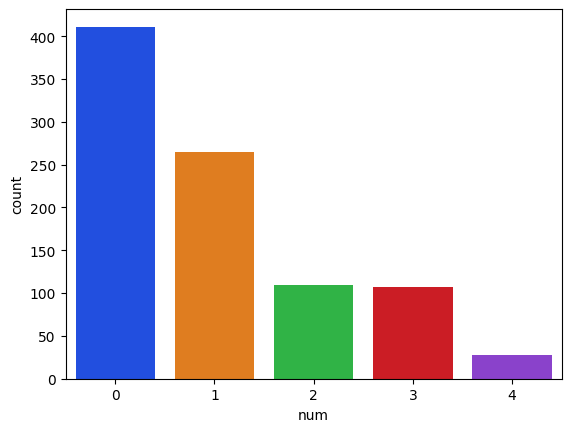

In [5]:
sns.countplot(df[target],palette=sns.color_palette('bright')[:5], saturation=0.75)

In [6]:
#числовые переменные
num_cols = [col for col in df.select_dtypes(include=["int", "float"]).columns if col not in [target]+['id']]
cat_cols = [col for col in df.select_dtypes(exclude=["int", "float"]).columns if col not in [target]+['id']]
df[num_cols]

,age,trestbps,chol,thalch,oldpeak,ca
0,63,145.0,233.0,150.0,2.3,0.0
1,67,160.0,286.0,108.0,1.5,3.0
2,67,120.0,229.0,129.0,2.6,2.0
3,37,130.0,250.0,187.0,3.5,0.0
4,41,130.0,204.0,172.0,1.4,0.0
...,...,...,...,...,...,...
915,54,127.0,333.0,154.0,0.0,NaN
916,62,NaN,139.0,NaN,NaN,NaN
917,55,122.0,223.0,100.0,0.0,NaN
918,58,NaN,385.0,NaN,NaN,NaN


In [7]:
df[cat_cols]

,sex,dataset,cp,fbs,restecg,exang,slope,thal
0,Male,Cleveland,typical angina,True,lv hypertrophy,False,downsloping,fixed defect
1,Male,Cleveland,asymptomatic,False,lv hypertrophy,True,flat,normal
2,Male,Cleveland,asymptomatic,False,lv hypertrophy,True,flat,reversable defect
3,Male,Cleveland,non-anginal,False,normal,False,downsloping,normal
4,Female,Cleveland,atypical angina,False,lv hypertrophy,False,upsloping,normal
...,...,...,...,...,...,...,...,...
915,Female,VA Long Beach,asymptomatic,True,st-t abnormality,False,NaN,NaN
916,Male,VA Long Beach,typical angina,False,st-t abnormality,NaN,NaN,NaN
917,Male,VA Long Beach,asymptomatic,True,st-t abnormality,False,NaN,fixed defect
918,Male,VA Long Beach,asymptomatic,True,lv hypertrophy,NaN,NaN,NaN


In [8]:
df[num_cols].describe()

,age,trestbps,chol,thalch,oldpeak,ca
count,920.000000,861.000000,890.000000,865.000000,858.000000,309.000000
mean,53.510870,132.132404,199.130337,137.545665,0.878788,0.676375
std,9.424685,19.066070,110.780810,25.926276,1.091226,0.935653
min,28.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,175.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,140.000000,0.500000,0.000000
75%,60.000000,140.000000,268.000000,157.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,202.000000,6.200000,3.000000


In [9]:
#мусорный признак
if 'id' in num_cols:
    num_cols.remove('id')

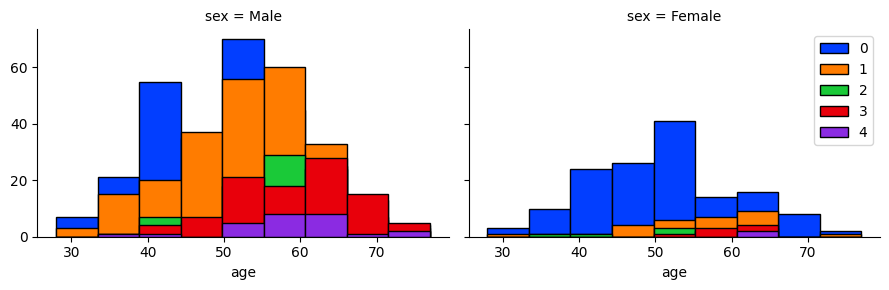

In [10]:
#проверим некоторые признаки: начнем с пола (проверим связь с целевой переменной для разных полов и возрастов)
bins = np.linspace(df.age.min(), df.age.max(), 10)
g = sns.FacetGrid(df, col="sex", hue="num", palette=sns.color_palette('bright')[:5], col_wrap=2, aspect=1.5)
g.map(plt.hist, 'age', bins=bins, ec="k")
g.axes[-1].legend()
plt.show()

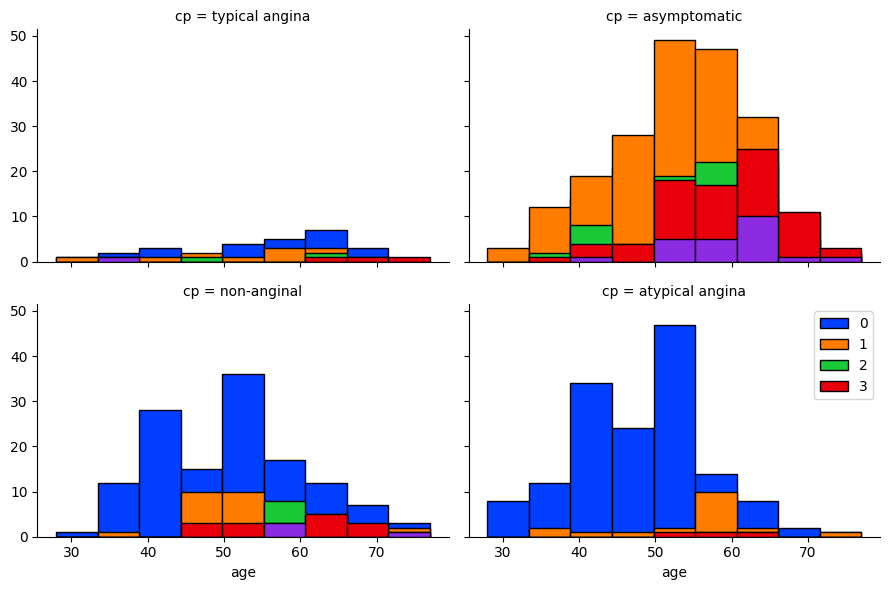

In [11]:
bins = np.linspace(df.age.min(), df.age.max(), 10)
g = sns.FacetGrid(df, col="cp", hue="num", palette=sns.color_palette('bright')[:5], col_wrap=2, aspect=1.5)
g.map(plt.hist, 'age', bins=bins, ec="k")
g.axes[-1].legend()
plt.show()

Для признака cp также есть корреляция с возрастом и целевой переменной

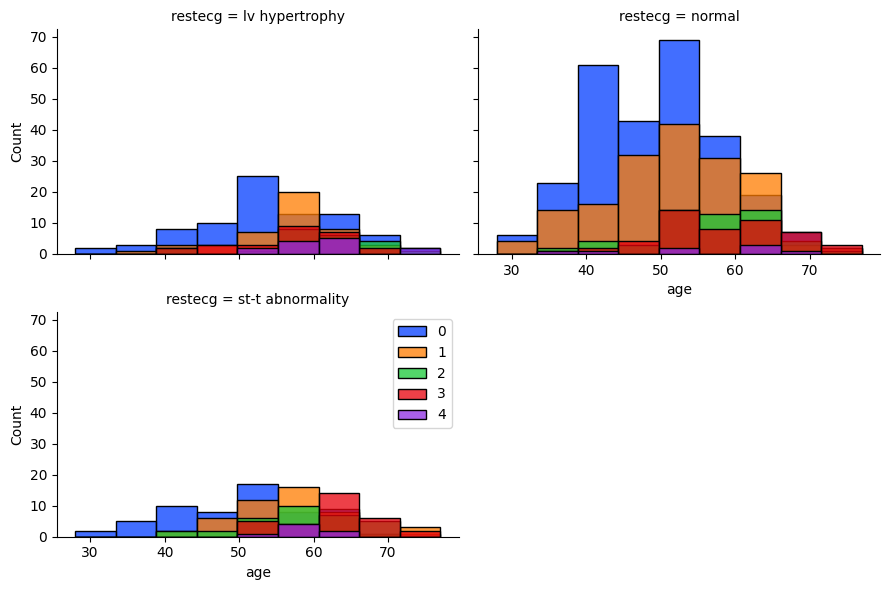

In [12]:
bins = np.linspace(df.age.min(), df.age.max(), 10)
g = sns.FacetGrid(df, col="restecg", hue="num", palette=sns.color_palette('bright')[:5], col_wrap=2, aspect=1.5)
g.map(sns.histplot, 'age', bins=bins, ec="k")
g.axes[-1].legend()
plt.show()

In [13]:
#для restecg доп. посмотрим связь с целевой переменной, можно уидветь, что для значения "normal" есть смещение в сторону класса 0 по сравнению с др типами экг
df.groupby(['restecg'])['num'].value_counts(normalize=True)

restecg           num
lv hypertrophy    0      0.436170
                  1      0.239362
                  3      0.138298
                  2      0.117021
                  4      0.069149
normal            0      0.486388
                  1      0.308530
                  2      0.099819
                  3      0.090744
                  4      0.014519
st-t abnormality  0      0.340782
                  1      0.268156
                  2      0.178771
                  3      0.173184
                  4      0.039106
Name: num, dtype: float64

In [14]:
#оценим пропуски по fbps
df[~df.trestbps.isna()].size

13776

<AxesSubplot:xlabel='trestbps'>

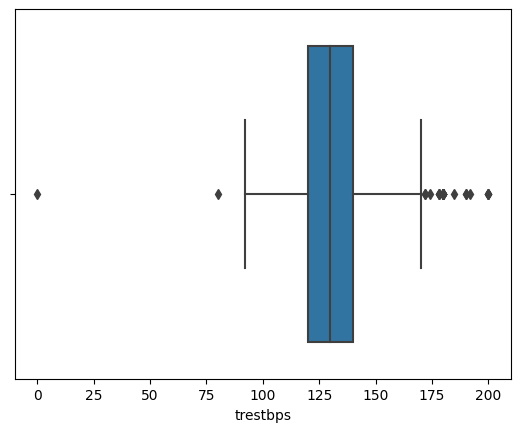

In [15]:
#оценим выбрасы по fbps
sns.boxplot(df.trestbps)

In [16]:
df.loc[df[df['trestbps'] < 50].index,'trestbps'] = np.nan

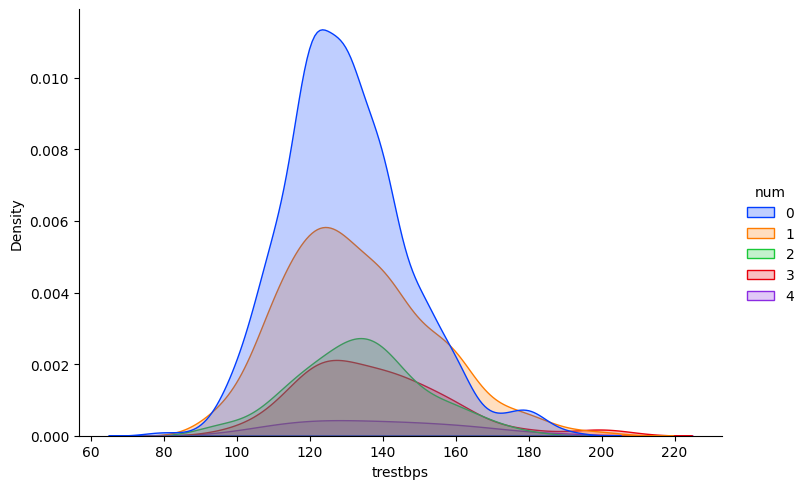

In [17]:
#проверим распределение фичи trestbps, в целом распределения похожи, отличие в основном в хвостах (можно выделить отдельный признак, давление > 180)
sns.displot(data=df, x='trestbps', hue='num', kind='kde', fill=True, palette=sns.color_palette('bright')[:5], height=5, aspect=1.5)

In [18]:
df.chol.isna().sum()

30

<AxesSubplot:xlabel='chol'>

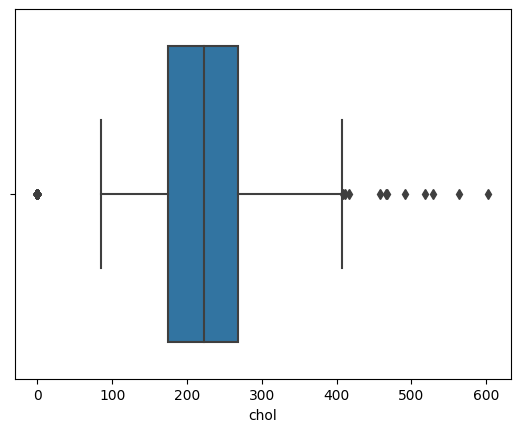

In [19]:
#оценим выбрасы по fbps
sns.boxplot(df.chol)

In [20]:
df.loc[df[df['chol'] < 50].index,'chol'] = np.nan

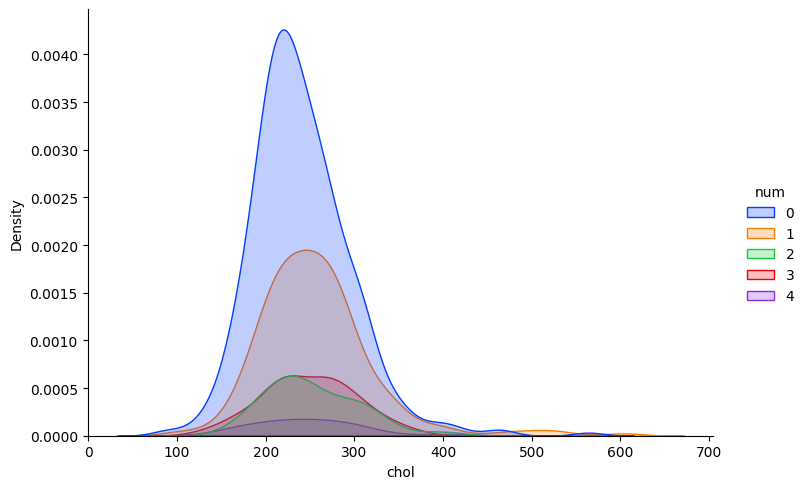

In [21]:
#проверим распределение фичи chol
sns.displot(data=df[~df.chol.isna()], x='chol', hue='num', kind='kde', fill=True, palette=sns.color_palette('bright')[:5], height=5, aspect=1.5)

<AxesSubplot:xlabel='fbs', ylabel='count'>

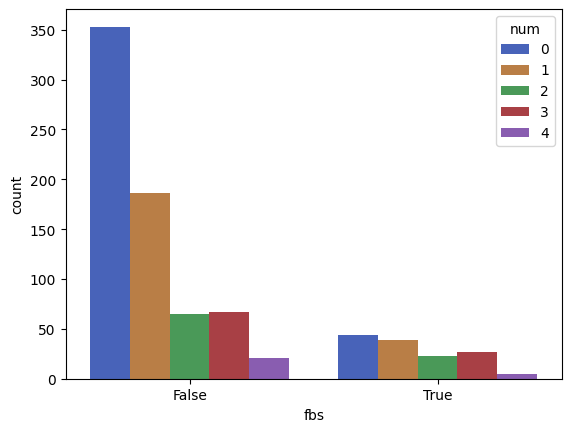

In [22]:
#признак fbs. Для значения false доля классов 0 и 1 значинетльно выше, чем для fbs=true
sns.countplot(data=df, x='fbs', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

In [23]:
df.fbs.isna().sum()

90

In [24]:
df.thalch.isna().sum()

55

<AxesSubplot:xlabel='thalch'>

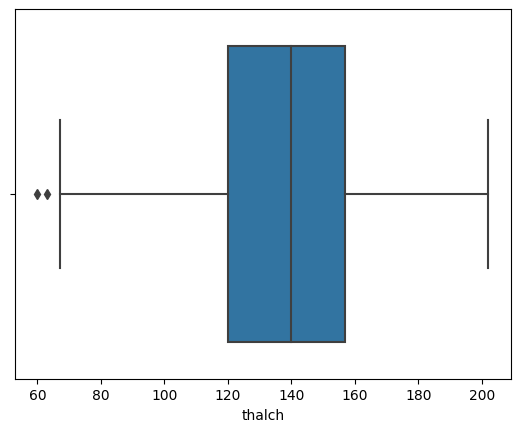

In [25]:
#оценим выбрасы thalch fbps
sns.boxplot(df.thalch)

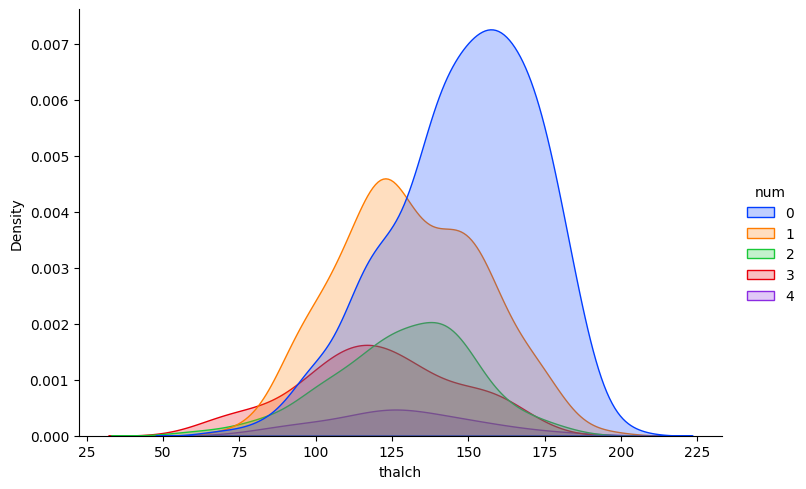

In [26]:
#макс частота сокращений выше для классов 0 и 1
sns.displot(data=df, x='thalch', hue='num', kind='kde', fill=True, palette=sns.color_palette('bright')[:5], height=5, aspect=1.5)

<AxesSubplot:xlabel='exang', ylabel='count'>

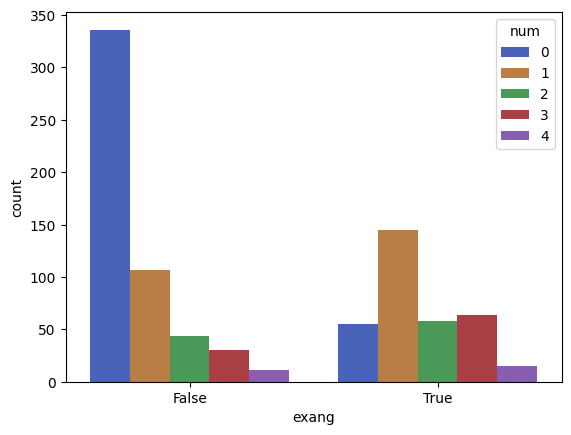

In [27]:
sns.countplot(data=df, x='exang', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

In [28]:
#оценим пропуска oldpeak
df.oldpeak.isna().sum()

62

<AxesSubplot:xlabel='oldpeak'>

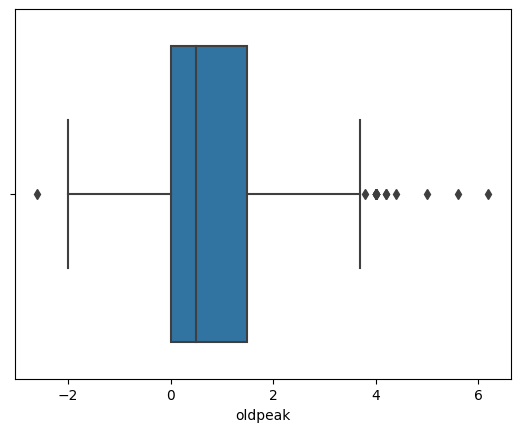

In [29]:
sns.boxplot(df.oldpeak)

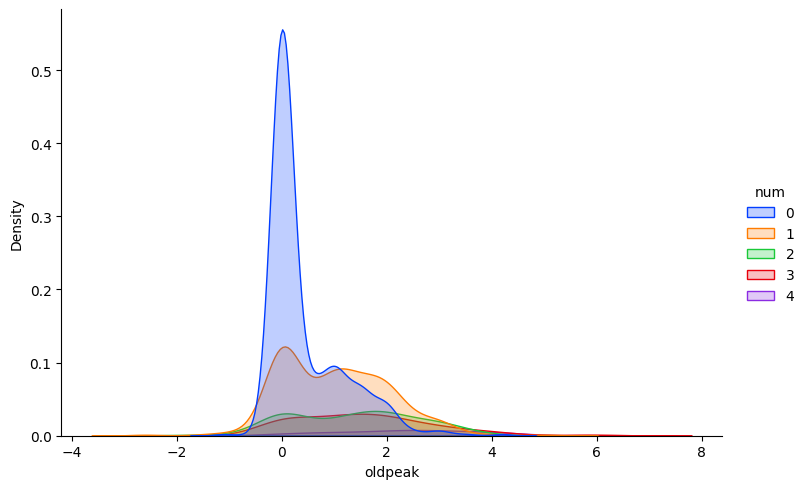

In [30]:
sns.displot(data=df, x='oldpeak', hue='num', kind='kde', fill=True, palette=sns.color_palette('bright')[:5], height=5, aspect=1.5)

In [31]:
df.slope.isna().sum()

309

<AxesSubplot:xlabel='slope', ylabel='count'>

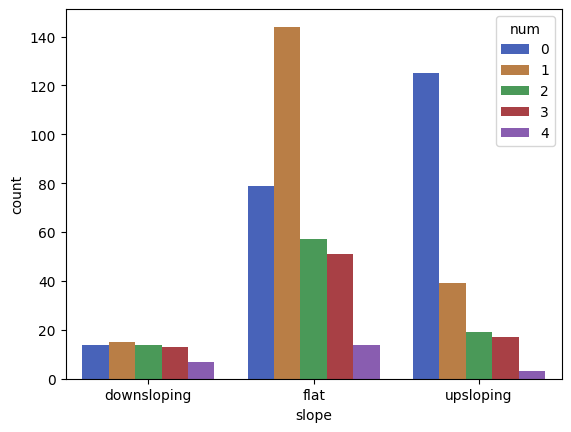

In [32]:
sns.countplot(data=df, x='slope', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

In [33]:
df.ca.isna().sum()

611

<AxesSubplot:xlabel='ca', ylabel='count'>

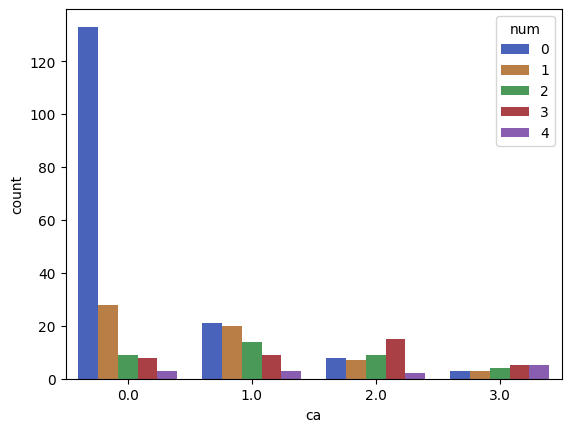

In [34]:
sns.countplot(data=df, x='ca', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

In [35]:
#ca можно рассмотреть как категориальный признак
if 'ca' in num_cols:
    num_cols.remove('ca')
if not 'ca' in cat_cols:
    cat_cols.append('ca')

In [36]:
df.thal.isna().sum()

486

<AxesSubplot:xlabel='thal', ylabel='count'>

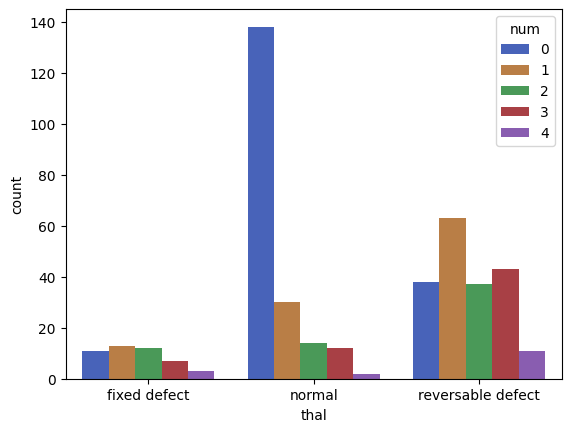

In [37]:
sns.countplot(data=df, x='thal', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

<AxesSubplot:xlabel='dataset', ylabel='count'>

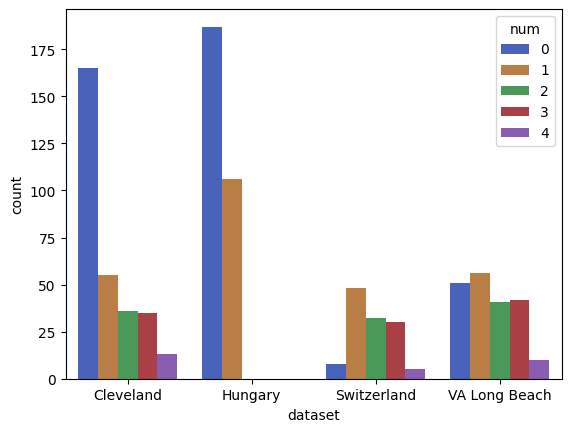

In [38]:
sns.countplot(data=df, x='dataset', hue='num', fill=True, palette=sns.color_palette('bright')[:5],  saturation=0.45)

In [39]:
df.groupby('dataset').size()

dataset
Cleveland        304
Hungary          293
Switzerland      123
VA Long Beach    200
dtype: int64

<AxesSubplot:>

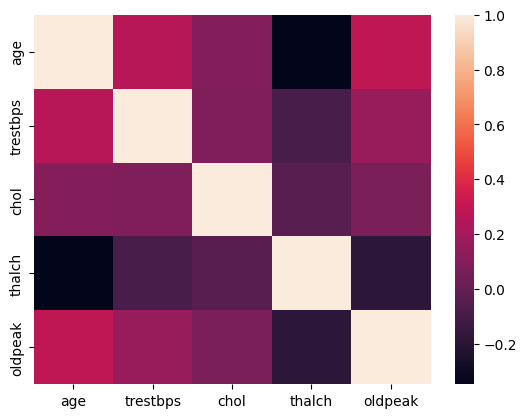

In [40]:
#проверим корреляцию признаков между собой и с таргетом
sns.heatmap(df[num_cols].corr(method='spearman'))

In [41]:
#для корреляции с категориальным таргетом лучше используем корелляцию Кендал-Тау
df[num_cols+[target]].corr(method='kendall')['num'] 

age         0.270346
trestbps    0.101348
chol        0.086773
thalch     -0.306491
oldpeak     0.360901
num         1.000000
Name: num, dtype: float64

значимых корреляций между числовыми признаками и таргетом нет,
проверим категориальные признаки, для этого используем критерий Крамера

In [42]:
from scipy.stats import chi2_contingency
# реализация расчета коэффициента Крамера.
# https://en.wikipedia.org/wiki/Cramér%27s_V
# формула реализована с учетом Bias Correction 
def cramer_v(x,y):
    confusion_matrix = pd.crosstab(x,y)
    if confusion_matrix.shape[0] == 0:
        return 0
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r,k = confusion_matrix.shape
    rcorr= r  - (r-1)**2 / (n - 1)
    kcorr= k  - (k-1)**2 / (n - 1)
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    if kcorr <= 1 or rcorr <= 1:
        return 0
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [43]:
import itertools

<AxesSubplot:>

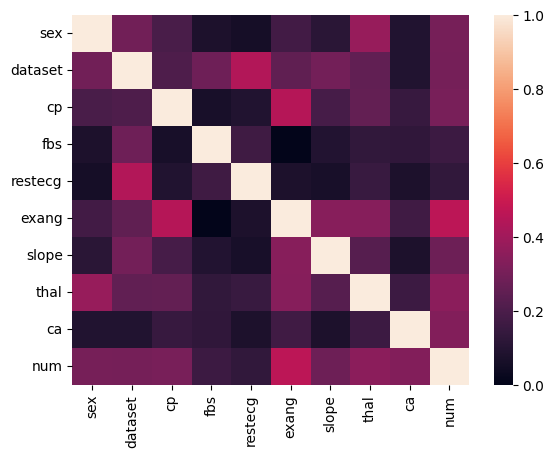

In [44]:
df_corr_cat = pd.DataFrame(columns=cat_cols+[target], index=cat_cols+[target], dtype=np.float)
for comb in list(itertools.combinations(cat_cols+[target], 2)):
    corr = cramer_v(df[comb[0]], df[comb[1]])
    df_corr_cat.loc[comb[0], comb[1]] = corr
    df_corr_cat.loc[comb[1], comb[0]] = corr
np.fill_diagonal(df_corr_cat.values, 1.0)
sns.heatmap(df_corr_cat)

Значимых корреляций не выявлено. Приступаем к построению папйлайнов.

In [45]:
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, OneHotEncoder, MinMaxScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer, KNNImputer

In [71]:
#   Для числовых - применяем SimpleImputer, а затем StandardScaler и затем селектим лучшие переменные через Аннову
numerical_pipeline_transformer = Pipeline(steps=[
                                        ("imputer", SimpleImputer(strategy='mean')),
                                        ("scaler", StandardScaler()),
                                        ("fs", SelectKBest(score_func=f_classif, k="all"))])


#   Для категориальных - применяем SimpleImputer,  OrdinalEncoder, селектим лучшие переменные через критерий хи2
categorical_pipeline_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy='most_frequent')),
    ("ordinal", OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)),
    ("fs", SelectKBest(score_func=chi2, k="all")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])


In [72]:
#сплитимся
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df, test_size=0.2, stratify=df[target], shuffle=True, random_state=143)

In [73]:
# Собираем воедино трансформеры 
data_pipeline_transformer = ColumnTransformer(transformers=[
    ("numerical", numerical_pipeline_transformer, num_cols), 
    ("categorical", categorical_pipeline_transformer, cat_cols),
], remainder='drop')


In [74]:
# Создание конвейера препроцессора, который сначала преобразует данные
preprocessor = Pipeline(steps=[("data_transformer", data_pipeline_transformer)])

In [75]:
#проверим работу трансформера
preprocessor.fit_transform(df_train, df_train[target])

array([[ 0.78358548,  0.39960672,  0.96804526, ...,  0.        ,
         0.        ,  0.        ],
       [-0.27578063, -0.44356264, -0.05113536, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.9954587 , -0.16250619,  1.5833996 , ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [-0.16984402, -2.12990138,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.46577564, -1.84884492, -0.6664897 , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.0420292 , -0.7246191 ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [76]:
#прицепим простую модель
from sklearn.linear_model import LogisticRegression

In [77]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')

classifier_pipeline = Pipeline(steps=[
    ('preproc', preprocessor),
    ('model', model)
])

classifier_pipeline

Pipeline(steps=[('preproc',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler()),
                                                                                   ('fs',
                                                                                    SelectKBest(k='all'))]),
                                                                   ['age',
                                                                    'trestbps',
                                                                    'chol',
                                                                    'thalch',
                                                                    'oldpeak']),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('ordinal',
                                                                                    OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                                                   unknown_value=-1)),
                                                                                   ('fs',
                                                                                    SelectKBest(k='all',
                                                                                                score_func=<function chi2 at 0x7eff5afaea60>)),
                                                                                   ('onehot',
                                                                                    OneHotEncoder(handle_unknown='ignore'))]),
                                                                   ['sex',
                                                                    'dataset',
                                                                    'cp', 'fbs',
                                                                    'restecg',
                                                                    'exang',
                                                                    'slope',
                                                                    'thal',
                                                                    'ca'])]))])),
                ('model', LogisticRegression(multi_class='multinomial'))])

In [78]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import make_scorer, f1_score, classification_report

In [79]:
f1 = make_scorer(f1_score, average="macro")
scores = cross_val_score(classifier_pipeline, df_train, df_train[target], scoring=f1, cv=3, n_jobs=-1)

In [80]:
scores

array([0.3758838 , 0.36106475, 0.42384249])

In [81]:
#сразу валидируемся на тесте
classifier_pipeline.fit(df_train, df_train[target])
preds = classifier_pipeline.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.81      0.90      0.86        82
           1       0.51      0.58      0.54        53
           2       0.36      0.23      0.28        22
           3       0.38      0.29      0.32        21
           4       0.00      0.00      0.00         6

    accuracy                           0.63       184
   macro avg       0.41      0.40      0.40       184
weighted avg       0.59      0.63      0.61       184



#### Базовые метрики понятны, начнем тюнинг параметров

In [82]:
from sklearn.model_selection import GridSearchCV

In [83]:
param_grid = {
    'model__solver': ['sag','saga','newton-cg', 'lbfgs'],
    'model__C': np.logspace(-5, 2, 100), # np.linspace(-10, 10)
    'model__penalty': ['l1', 'l2'],
    'model__class_weight': ['balanced', None],
    'preproc__data_transformer__numerical__imputer':[SimpleImputer(strategy='median'), SimpleImputer(strategy='mean'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5), KNNImputer(n_neighbors=6)],
    'preproc__data_transformer__numerical__scaler':[StandardScaler(), MinMaxScaler()],
    'preproc__data_transformer__numerical__fs__k':['all', 4, 3],
    'preproc__data_transformer__categorical__imputer':[SimpleImputer(strategy='most_frequent'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5), KNNImputer(n_neighbors=6)],
    'preproc__data_transformer__categorical__fs__k':['all', 8, 7, 6],
}

search = GridSearchCV(classifier_pipeline, param_grid, 
                      verbose=True, 
                      n_jobs=-1, cv=3, scoring=f1)

search.fit(df_train, df_train[target])

Fitting 3 folds for each of 768000 candidates, totalling 2304000 fits


/home/denis/.virtualenvs/otus/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/denis/.virtualenvs/otus/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/denis/.virtualenvs/otus/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/denis/.virtualenvs/otus/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/denis/.virtualenvs/otus/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/home/denis/.virtualenvs/otus/lib/p

In [84]:
search.best_score_

0.43554393278738396

In [85]:
preds = search.best_estimator_.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.83      0.87      0.85        82
           1       0.68      0.32      0.44        53
           2       0.21      0.32      0.25        22
           3       0.29      0.43      0.35        21
           4       0.22      0.33      0.27         6

    accuracy                           0.58       184
   macro avg       0.45      0.45      0.43       184
weighted avg       0.63      0.58      0.58       184



In [86]:
search.best_params_

{'model__C': 0.047508101621027934,
 'model__class_weight': 'balanced',
 'model__penalty': 'l2',
 'model__solver': 'sag',
 'preproc__data_transformer__categorical__fs__k': 'all',
 'preproc__data_transformer__categorical__imputer': SimpleImputer(strategy='most_frequent'),
 'preproc__data_transformer__numerical__fs__k': 'all',
 'preproc__data_transformer__numerical__imputer': KNNImputer(),
 'preproc__data_transformer__numerical__scaler': StandardScaler()}

In [242]:
#попробуем random forest
from sklearn.ensemble import RandomForestClassifier

In [243]:
model2 = RandomForestClassifier(n_estimators=50, max_depth=8, class_weight="balanced", random_state=143, n_jobs=-1)

classifier_pipeline2 = Pipeline(steps=[
    ('preproc', preprocessor),
    ('model', model2)
])

classifier_pipeline2

Pipeline(steps=[('preproc',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler()),
                                                                                   ('fs',
                                                                                    SelectKBest(k='all'))]),
                                                                   ['age',
                                                                    'trestbps',
                                                                    'chol',
                                                                    'thalch',
                                                                    'oldpeak']),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('ordinal',
                                                                                    OrdinalEncoder()),
                                                                                   ('fs',
                                                                                    SelectKBest(k='all',
                                                                                                score_func=<function chi2 at 0x7f1de6b1d940>)),
                                                                                   ('onehot',
                                                                                    OneHotEncoder(handle_unknown='ignore'))]),
                                                                   ['sex',
                                                                    'dataset',
                                                                    'cp', 'fbs',
                                                                    'restecg',
                                                                    'exang',
                                                                    'slope',
                                                                    'thal',
                                                                    'ca'])]))])),
                ('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=8,
                                        n_estimators=50, n_jobs=-1,
                                        random_state=143))])

In [244]:
f1 = make_scorer(f1_score, average="macro")
scores = cross_val_score(classifier_pipeline2, df_train, df_train[target], scoring=f1, cv=3, n_jobs=-1)

In [245]:
scores

array([0.43713194, 0.34039049, 0.42404964])

In [246]:
#сразу валидируемся на тесте
classifier_pipeline2.fit(df_train, df_train[target])
preds = classifier_pipeline2.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.83      0.88      0.85        82
           1       0.64      0.40      0.49        53
           2       0.26      0.32      0.29        22
           3       0.30      0.52      0.38        21
           4       0.00      0.00      0.00         6

    accuracy                           0.60       184
   macro avg       0.40      0.42      0.40       184
weighted avg       0.62      0.60      0.60       184



In [248]:
param_grid = {
    'model__n_estimators': [50,70,100,130],
    'model__max_depth': [6,8,10,12,14,16],
    'model__class_weight': [None, 'balanced'],
    'preproc__data_transformer__numerical__imputer':[SimpleImputer(strategy='median'), SimpleImputer(strategy='mean'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5), KNNImputer(n_neighbors=6)],
    'preproc__data_transformer__numerical__scaler':[StandardScaler(), MinMaxScaler()],
    'preproc__data_transformer__numerical__fs__k':['all', 4, 3],
    'preproc__data_transformer__categorical__imputer':[SimpleImputer(strategy='most_frequent'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5), KNNImputer(n_neighbors=6)],
    'preproc__data_transformer__categorical__fs__k':['all', 8, 7],
}

search2 = GridSearchCV(classifier_pipeline2, param_grid, 
                      verbose=True, 
                      n_jobs=-1, cv=3, scoring=f1)

search2.fit(df_train, df_train[target])

Fitting 3 folds for each of 17280 candidates, totalling 51840 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preproc',
                                        Pipeline(steps=[('data_transformer',
                                                         ColumnTransformer(transformers=[('numerical',
                                                                                          Pipeline(steps=[('imputer',
                                                                                                           SimpleImputer()),
                                                                                                          ('scaler',
                                                                                                           StandardScaler()),
                                                                                                          ('fs',
                                                                                                           SelectKBest(k='all'))]),
                                                                                          ['age',
                                                                                           'trestbps',
                                                                                           'chol',
                                                                                           'thalch',
                                                                                           'oldpeak']),
                                                                                         ('categorical',
                                                                                          Pipeline(steps=[('imputer',
                                                                                                           SimpleImputer(strategy='...
                         'preproc__data_transformer__numerical__fs__k': ['all',
                                                                         4, 3],
                         'preproc__data_transformer__numerical__imputer': [SimpleImputer(strategy='median'),
                                                                           SimpleImputer(),
                                                                           KNNImputer(n_neighbors=4),
                                                                           KNNImputer(),
                                                                           KNNImputer(n_neighbors=6)],
                         'preproc__data_transformer__numerical__scaler': [StandardScaler(),
                                                                          MinMaxScaler()]},
             scoring=make_scorer(f1_score, average=macro), verbose=True)

In [250]:
search2.best_score_

0.4251942127051745

In [251]:
search2.best_params_

{'model__class_weight': 'balanced',
 'model__max_depth': 6,
 'model__n_estimators': 50,
 'preproc__data_transformer__categorical__fs__k': 'all',
 'preproc__data_transformer__categorical__imputer': SimpleImputer(strategy='most_frequent'),
 'preproc__data_transformer__numerical__fs__k': 4,
 'preproc__data_transformer__numerical__imputer': SimpleImputer(strategy='median'),
 'preproc__data_transformer__numerical__scaler': MinMaxScaler()}

In [252]:
#сразу валидируемся на тесте
preds = search2.best_estimator_.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.89      0.88      0.88        82
           1       0.61      0.36      0.45        53
           2       0.19      0.27      0.23        22
           3       0.28      0.52      0.37        21
           4       0.00      0.00      0.00         6

    accuracy                           0.59       184
   macro avg       0.40      0.41      0.39       184
weighted avg       0.63      0.59      0.59       184



In [253]:
#попробуем xgboost
from xgboost import XGBClassifier

In [258]:
model3 = XGBClassifier(n_estimators=50, max_depth=8, learning_rate=0.1,random_state=143, n_jobs=-1)

classifier_pipeline3 = Pipeline(steps=[
    ('preproc', preprocessor),
    ('model', model3)
])

classifier_pipeline3

Pipeline(steps=[('preproc',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer()),
                                                                                   ('scaler',
                                                                                    StandardScaler()),
                                                                                   ('fs',
                                                                                    SelectKBest(k='all'))]),
                                                                   ['age',
                                                                    'trestbps',
                                                                    'chol',
                                                                    'thalch',
                                                                    'oldpeak']),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('imputer',
                                                                                    SimpleImputer(strategy='most_frequent')),
                                                                                   ('ordinal',...
                               gamma=None, gpu_id=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=8,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               n_estimators=50, n_jobs=-1,
                               num_parallel_tree=None, predictor=None,
                               random_state=143, reg_alpha=None,
                               reg_lambda=None, ...))])

In [259]:
f1 = make_scorer(f1_score, average="macro")
scores = cross_val_score(classifier_pipeline3, df_train, df_train[target], scoring=f1, cv=3, n_jobs=-1)

In [260]:
scores

array([0.42911098, 0.38276723, 0.46643917])

In [262]:
param_grid = {
    'model__n_estimators': [50,70,100,130],
    'model__max_depth': [8,10,12,14],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__subsample' : [0.6, 0.8, 1],
    'model__lambda': [0.0,0.3,0.6,1.0],
    'model__alpha': [0.0,0.3,0.6,1.0],
    'preproc__data_transformer__numerical__imputer':[SimpleImputer(strategy='median'), SimpleImputer(strategy='mean'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5)],
    'preproc__data_transformer__numerical__scaler':[StandardScaler(), MinMaxScaler()],
    'preproc__data_transformer__numerical__fs__k':['all', 4, 3],
    'preproc__data_transformer__categorical__imputer':[SimpleImputer(strategy='most_frequent'), KNNImputer(n_neighbors=4), KNNImputer(n_neighbors=5)],
    'preproc__data_transformer__categorical__fs__k':['all', 8, 7],
}

search3 = GridSearchCV(classifier_pipeline3, param_grid, 
                      verbose=True, 
                      n_jobs=-1, cv=3, scoring=f1)

search3.fit(df_train, df_train[target])

Fitting 3 folds for each of 497664 candidates, totalling 1492992 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preproc',
                                        Pipeline(steps=[('data_transformer',
                                                         ColumnTransformer(transformers=[('numerical',
                                                                                          Pipeline(steps=[('imputer',
                                                                                                           SimpleImputer()),
                                                                                                          ('scaler',
                                                                                                           StandardScaler()),
                                                                                                          ('fs',
                                                                                                           SelectKBest(k='all'))]),
                                                                                          ['age',
                                                                                           'trestbps',
                                                                                           'chol',
                                                                                           'thalch',
                                                                                           'oldpeak']),
                                                                                         ('categorical',
                                                                                          Pipeline(steps=[('imputer',
                                                                                                           SimpleImputer(strategy='...
                                                                             KNNImputer(n_neighbors=4),
                                                                             KNNImputer()],
                         'preproc__data_transformer__numerical__fs__k': ['all',
                                                                         4, 3],
                         'preproc__data_transformer__numerical__imputer': [SimpleImputer(strategy='median'),
                                                                           SimpleImputer(),
                                                                           KNNImputer(n_neighbors=4),
                                                                           KNNImputer()],
                         'preproc__data_transformer__numerical__scaler': [StandardScaler(),
                                                                          MinMaxScaler()]},
             scoring=make_scorer(f1_score, average=macro), verbose=True)

In [263]:
search3.best_score_

0.45209556505143206

In [264]:
search3.best_params_

{'model__alpha': 0.3,
 'model__lambda': 0.0,
 'model__learning_rate': 0.05,
 'model__max_depth': 14,
 'model__n_estimators': 130,
 'model__subsample': 1,
 'preproc__data_transformer__categorical__fs__k': 8,
 'preproc__data_transformer__categorical__imputer': SimpleImputer(strategy='most_frequent'),
 'preproc__data_transformer__numerical__fs__k': 'all',
 'preproc__data_transformer__numerical__imputer': SimpleImputer(),
 'preproc__data_transformer__numerical__scaler': StandardScaler()}

In [265]:
#сразу валидируемся на тесте
preds = search3.best_estimator_.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.81      0.88      0.84        82
           1       0.47      0.42      0.44        53
           2       0.20      0.23      0.21        22
           3       0.36      0.38      0.37        21
           4       0.00      0.00      0.00         6

    accuracy                           0.58       184
   macro avg       0.37      0.38      0.37       184
weighted avg       0.56      0.58      0.57       184



#### На текущий момент лидером является Лог регрессия. Попробуем еще улучшить прогноз за счет ансамбля моделей.

#### Voting

In [284]:
from copy import deepcopy
from sklearn.ensemble import VotingClassifier

# получим список эстиматоров
estimators = [
    ("log_reg", deepcopy(search.best_estimator_)),
    ("rf", deepcopy(search2.best_estimator_)),
    ("xgb", deepcopy(search3.best_estimator_)),
]

blending_classifier = VotingClassifier(
    estimators=estimators
)

blending_classifier

VotingClassifier(estimators=[('log_reg',
                              Pipeline(steps=[('preproc',
                                               Pipeline(steps=[('data_transformer',
                                                                ColumnTransformer(transformers=[('numerical',
                                                                                                 Pipeline(steps=[('imputer',
                                                                                                                  KNNImputer()),
                                                                                                                 ('scaler',
                                                                                                                  StandardScaler()),
                                                                                                                 ('fs',
                                                                                                                  SelectKBest(k='all'))]),
                                                                                                 ['age',
                                                                                                  'trestbps',
                                                                                                  'chol',
                                                                                                  'thalch',
                                                                                                  'oldpeak']),
                                                                                                ('categorical',
                                                                                                 Pipeline(steps=[('imputer',
                                                                                                                  SimpleImputer(s...
                                                             gamma=0, gpu_id=-1,
                                                             grow_policy='depthwise',
                                                             importance_type=None,
                                                             interaction_constraints='',
                                                             lambda=0.0,
                                                             learning_rate=0.05,
                                                             max_bin=256,
                                                             max_cat_to_onehot=4,
                                                             max_delta_step=0,
                                                             max_depth=14,
                                                             max_leaves=0,
                                                             min_child_weight=1,
                                                             missing=nan,
                                                             monotone_constraints='()',
                                                             n_estimators=130,
                                                             n_jobs=-1,
                                                             num_parallel_tree=1,
                                                             objective='multi:softprob',
                                                             predictor='auto', ...))]))])

In [285]:
blending_classifier.fit(df_train, df_train[target])

VotingClassifier(estimators=[('log_reg',
                              Pipeline(steps=[('preproc',
                                               Pipeline(steps=[('data_transformer',
                                                                ColumnTransformer(transformers=[('numerical',
                                                                                                 Pipeline(steps=[('imputer',
                                                                                                                  KNNImputer()),
                                                                                                                 ('scaler',
                                                                                                                  StandardScaler()),
                                                                                                                 ('fs',
                                                                                                                  SelectKBest(k='all'))]),
                                                                                                 ['age',
                                                                                                  'trestbps',
                                                                                                  'chol',
                                                                                                  'thalch',
                                                                                                  'oldpeak']),
                                                                                                ('categorical',
                                                                                                 Pipeline(steps=[('imputer',
                                                                                                                  SimpleImputer(s...
                                                             gamma=0, gpu_id=-1,
                                                             grow_policy='depthwise',
                                                             importance_type=None,
                                                             interaction_constraints='',
                                                             lambda=0.0,
                                                             learning_rate=0.05,
                                                             max_bin=256,
                                                             max_cat_to_onehot=4,
                                                             max_delta_step=0,
                                                             max_depth=14,
                                                             max_leaves=0,
                                                             min_child_weight=1,
                                                             missing=nan,
                                                             monotone_constraints='()',
                                                             n_estimators=130,
                                                             n_jobs=-1,
                                                             num_parallel_tree=1,
                                                             objective='multi:softprob',
                                                             predictor='auto', ...))]))])

In [286]:
preds = blending_classifier.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86        82
           1       0.54      0.38      0.44        53
           2       0.16      0.23      0.19        22
           3       0.36      0.48      0.41        21
           4       0.00      0.00      0.00         6

    accuracy                           0.59       184
   macro avg       0.38      0.39      0.38       184
weighted avg       0.59      0.59      0.58       184



#### Результат хуже чем у просто регрессии, проверим стекинг

In [288]:
from sklearn.ensemble import StackingClassifier

In [297]:
# в качестве метамодели попробуем GaussianNB
from sklearn.naive_bayes import GaussianNB

In [298]:
stacking_classifier = StackingClassifier(
    estimators=estimators,
    final_estimator=GaussianNB(),
    n_jobs=-1,
    verbose=True,
)

stacking_classifier

StackingClassifier(estimators=[('log_reg',
                                Pipeline(steps=[('preproc',
                                                 Pipeline(steps=[('data_transformer',
                                                                  ColumnTransformer(transformers=[('numerical',
                                                                                                   Pipeline(steps=[('imputer',
                                                                                                                    KNNImputer()),
                                                                                                                   ('scaler',
                                                                                                                    StandardScaler()),
                                                                                                                   ('fs',
                                                                                                                    SelectKBest(k='all'))]),
                                                                                                   ['age',
                                                                                                    'trestbps',
                                                                                                    'chol',
                                                                                                    'thalch',
                                                                                                    'oldpeak']),
                                                                                                  ('categorical',
                                                                                                   Pipeline(steps=[('imputer',
                                                                                                                    SimpleImputer...
                                                               importance_type=None,
                                                               interaction_constraints='',
                                                               lambda=0.0,
                                                               learning_rate=0.05,
                                                               max_bin=256,
                                                               max_cat_to_onehot=4,
                                                               max_delta_step=0,
                                                               max_depth=14,
                                                               max_leaves=0,
                                                               min_child_weight=1,
                                                               missing=nan,
                                                               monotone_constraints='()',
                                                               n_estimators=130,
                                                               n_jobs=-1,
                                                               num_parallel_tree=1,
                                                               objective='multi:softprob',
                                                               predictor='auto', ...))]))],
                   final_estimator=GaussianNB(), n_jobs=-1, verbose=True)

In [299]:
stacking_classifier.fit(df_train, df_train[target])

StackingClassifier(estimators=[('log_reg',
                                Pipeline(steps=[('preproc',
                                                 Pipeline(steps=[('data_transformer',
                                                                  ColumnTransformer(transformers=[('numerical',
                                                                                                   Pipeline(steps=[('imputer',
                                                                                                                    KNNImputer()),
                                                                                                                   ('scaler',
                                                                                                                    StandardScaler()),
                                                                                                                   ('fs',
                                                                                                                    SelectKBest(k='all'))]),
                                                                                                   ['age',
                                                                                                    'trestbps',
                                                                                                    'chol',
                                                                                                    'thalch',
                                                                                                    'oldpeak']),
                                                                                                  ('categorical',
                                                                                                   Pipeline(steps=[('imputer',
                                                                                                                    SimpleImputer...
                                                               importance_type=None,
                                                               interaction_constraints='',
                                                               lambda=0.0,
                                                               learning_rate=0.05,
                                                               max_bin=256,
                                                               max_cat_to_onehot=4,
                                                               max_delta_step=0,
                                                               max_depth=14,
                                                               max_leaves=0,
                                                               min_child_weight=1,
                                                               missing=nan,
                                                               monotone_constraints='()',
                                                               n_estimators=130,
                                                               n_jobs=-1,
                                                               num_parallel_tree=1,
                                                               objective='multi:softprob',
                                                               predictor='auto', ...))]))],
                   final_estimator=GaussianNB(), n_jobs=-1, verbose=True)

In [300]:
preds = stacking_classifier.predict(df_test)
print(classification_report(df_test[target], preds))

              precision    recall  f1-score   support

           0       0.88      0.85      0.86        82
           1       0.53      0.30      0.39        53
           2       0.19      0.45      0.27        22
           3       0.36      0.24      0.29        21
           4       0.00      0.00      0.00         6

    accuracy                           0.55       184
   macro avg       0.39      0.37      0.36       184
weighted avg       0.61      0.55      0.56       184



### Итого, вывод на текущий момент лучшая модель это ЛогРегрессия с подобранными параметрами по сетке

In [87]:
from sklearn.metrics import log_loss

preds = search.best_estimator_.predict_proba(df_test)
log_loss(df_test[target].values, preds)

1.0776219309356643

In [89]:
#найдем параметры KNN эсиматора, т.к. они были не видны в best_estimator
search.best_estimator_.named_steps['preproc']['data_transformer'].named_transformers_['numerical']['imputer'].get_params()

{'add_indicator': False,
 'copy': True,
 'metric': 'nan_euclidean',
 'missing_values': nan,
 'n_neighbors': 5,
 'weights': 'uniform'}

In [91]:
#сохраняем модель через joblib
from joblib import dump

dump(search.best_estimator_, 'models/v0.0.2.pkl')

['models/v0.0.2.pkl']

In [92]:
search.best_estimator_.predict(df_test)

array([0, 0, 0, 0, 0, 3, 2, 3, 0, 0, 0, 0, 3, 1, 0, 0, 0, 0, 3, 2, 0, 3,
       1, 0, 0, 0, 3, 3, 2, 0, 1, 1, 0, 0, 3, 0, 2, 3, 3, 0, 2, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 3, 3, 0, 1, 0, 2, 0, 4, 4, 3,
       0, 2, 2, 3, 2, 0, 2, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 3,
       0, 0, 3, 2, 0, 3, 3, 1, 3, 1, 0, 1, 2, 2, 0, 4, 4, 2, 0, 0, 1, 1,
       3, 2, 4, 2, 2, 0, 0, 0, 2, 1, 1, 3, 2, 1, 1, 0, 0, 0, 0, 0, 4, 1,
       0, 1, 0, 4, 0, 0, 2, 0, 2, 1, 0, 0, 0, 3, 2, 0, 1, 3, 3, 2, 0, 1,
       3, 0, 3, 0, 0, 2, 2, 0, 2, 3, 0, 0, 3, 2, 0, 4, 4, 0, 2, 0, 0, 1,
       3, 0, 2, 0, 3, 0, 2, 2])

In [103]:
df_test.tail()

,id,age,sex,dataset,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,ca,thal,num
338,339,39,Male,Hungary,atypical angina,190.0,241.0,False,normal,106.0,False,0.0,NaN,NaN,NaN,0
836,837,55,Male,VA Long Beach,asymptomatic,116.0,186.0,True,st-t abnormality,102.0,False,0.0,NaN,NaN,NaN,2
333,334,39,Female,Hungary,non-anginal,110.0,182.0,False,st-t abnormality,180.0,False,0.0,NaN,NaN,NaN,0
805,806,63,Male,VA Long Beach,asymptomatic,130.0,308.0,False,normal,138.0,True,2.0,flat,NaN,NaN,2
776,777,53,Male,VA Long Beach,asymptomatic,154.0,NaN,NaN,st-t abnormality,140.0,True,1.5,flat,NaN,NaN,2
